In [1]:
import numpy as np
import xarray as xr
import scipy.signal as sg
import pandas as pd
import scipy.stats as st
import matplotlib.pyplot as plt
from matplotlib import patches
import npc_lims
# from sklearn.metrics import roc_curve, roc_auc_score
# from statsmodels.stats.multitest import fdrcorrection
# from npc_sessions import DynamicRoutingSession
from dynamic_routing_analysis import spike_utils, decoding_utils
import os

%load_ext autoreload
%autoreload 2
%matplotlib widget

In [2]:
ephys_sessions=tuple(s for s in npc_lims.get_session_info(is_ephys=True, is_uploaded=True,))

c:\Anaconda3\envs\npc_analysis\Lib\site-packages\npc_lims\metadata\codeocean.py:201: UserWarning: There is more than one asset for session = '644866_2023-02-08'. Defaulting to most recent: ('ecephys_644866_2023-02-08_16-01-11', 'ecephys_644866_2023-02-08_16-01-11')
  warnings.warn(
c:\Anaconda3\envs\npc_analysis\Lib\site-packages\npc_lims\metadata\codeocean.py:201: UserWarning: There is more than one asset for session = '664851_2023-11-14'. Defaulting to most recent: ('ecephys_664851_2023-11-14_12-44-33', 'ecephys_664851_2023-11-14_12-44-33')
  warnings.warn(
c:\Anaconda3\envs\npc_analysis\Lib\site-packages\npc_lims\metadata\codeocean.py:201: UserWarning: There is more than one asset for session = '686176_2023-12-06'. Defaulting to most recent: ('ecephys_686176_2023-12-06_13-03-34', 'ecephys_686176_2023-12-06_13-03-34')
  warnings.warn(


In [14]:
session=ephys_sessions[6]

In [30]:
trials=pd.read_parquet(
            npc_lims.get_cache_path('trials',session.id,version='any')
        )
# units=pd.read_parquet(
#             npc_lims.get_cache_path('units',session.id,version='any')
#         )

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

failed for session 676909_2023-12-11


C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type


failed for session 686176_2023-12-06


C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

failed for session 690706_2023-11-28


C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

failed for session 681532_2023-10-19


C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

failed for session 667252_2023-09-27


C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

failed for session 668755_2023-08-29


C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

failed for session 666986_2023-08-14


C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type


failed for session 660023_2023-08-08


C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type


failed for session 644867_2023-02-21


C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\3959352815.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .l

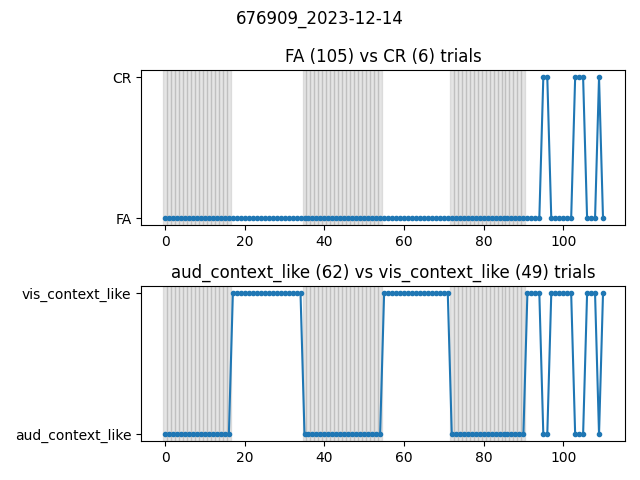

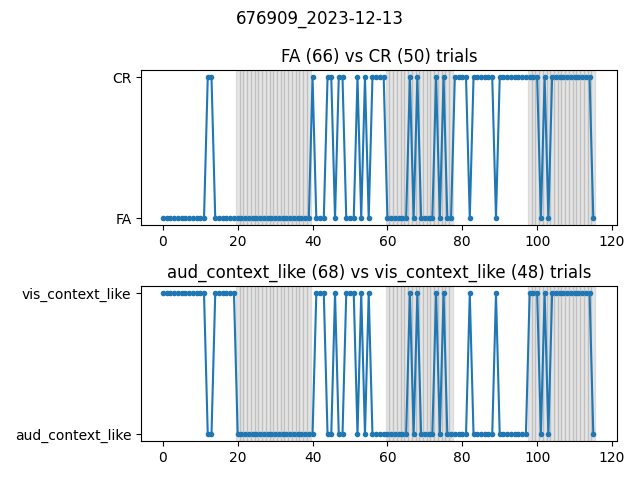

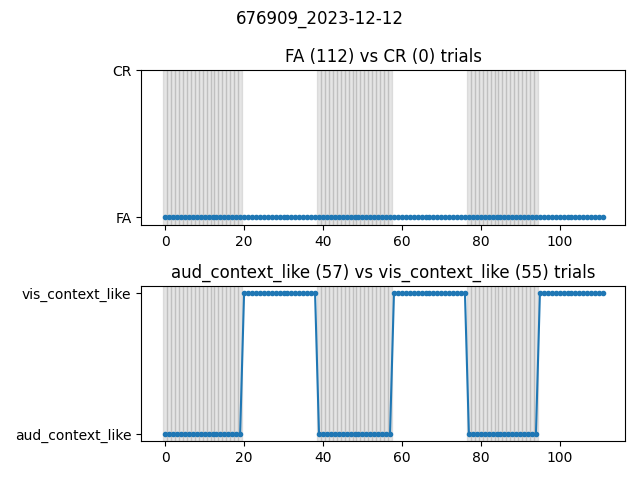

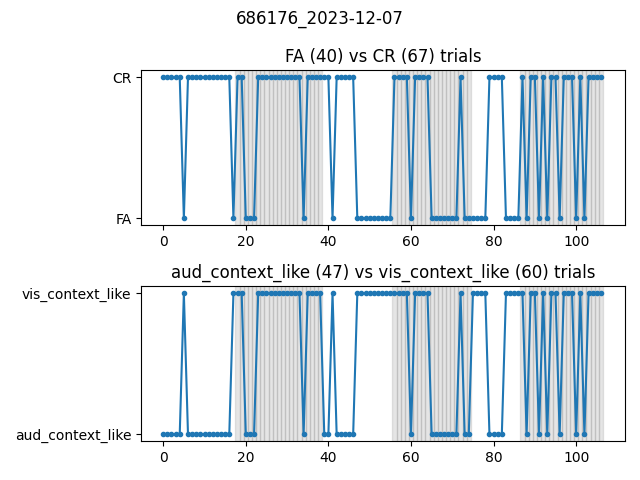

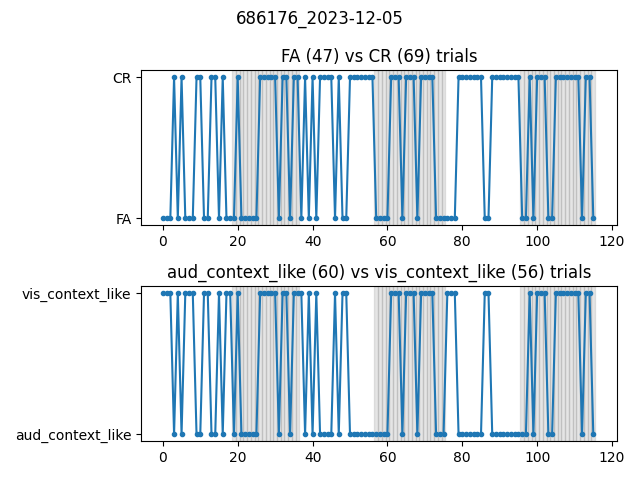

...

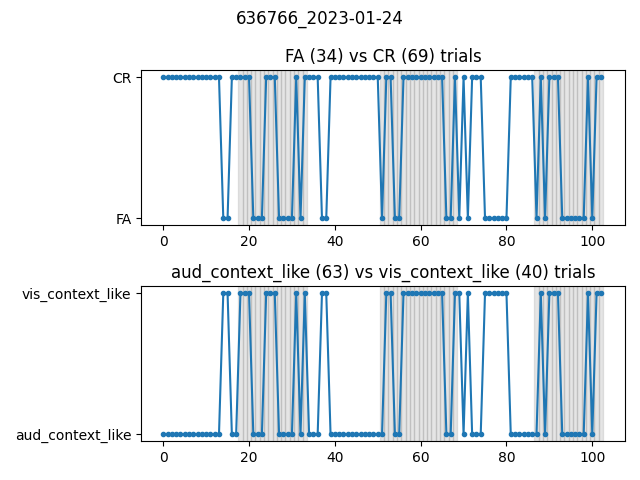

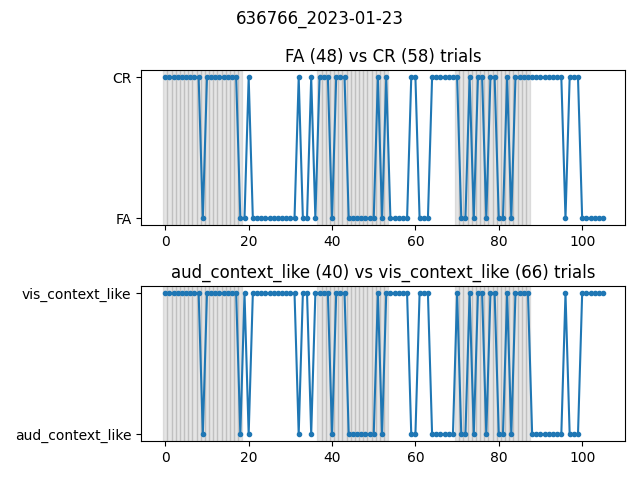

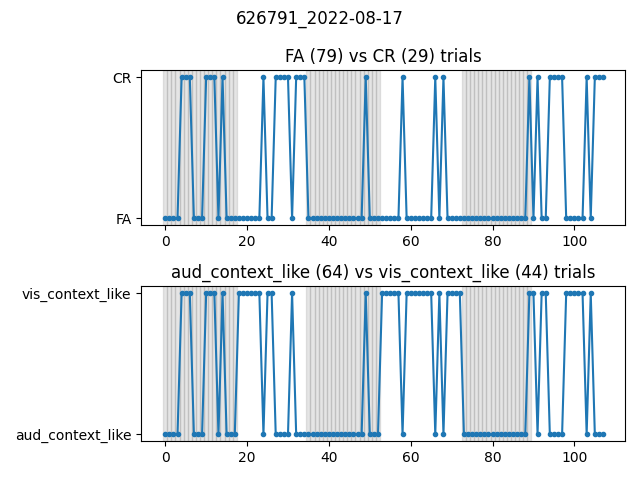

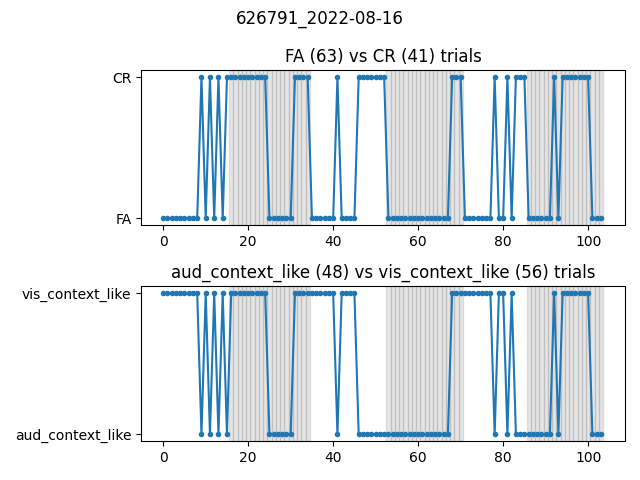

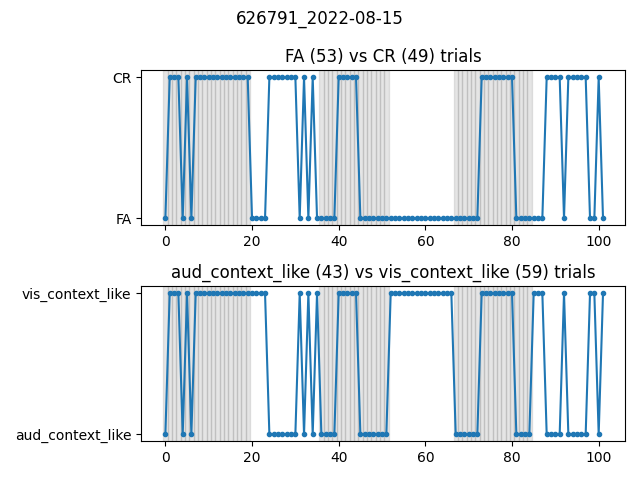

In [47]:
#make plot for every session

for session in ephys_sessions:

    try:
        if 'DynamicRouting' not in session.project:
            continue

        trials=pd.read_parquet(
            npc_lims.get_cache_path('trials',session.id,version='any')
        )

        #CR vs. FA trials
        CR_FA_trials=trials.query('(is_correct_reject and is_target) or (is_false_alarm and is_target)')

        #add new labels to trials = visual_context_like_behavior, auditory_context_like_behavior
        behavior_type=[]

        for ii in range(len(CR_FA_trials)):
            if ((CR_FA_trials.iloc[ii]['is_vis_context'] and CR_FA_trials.iloc[ii]['is_aud_target'] and not CR_FA_trials.iloc[ii]['is_response']) or
                (CR_FA_trials.iloc[ii]['is_aud_context'] and CR_FA_trials.iloc[ii]['is_vis_target'] and CR_FA_trials.iloc[ii]['is_response'])):
                behavior_type.append('vis_context_like')
            elif ((CR_FA_trials.iloc[ii]['is_aud_context'] and CR_FA_trials.iloc[ii]['is_vis_target'] and not CR_FA_trials.iloc[ii]['is_response']) or
                (CR_FA_trials.iloc[ii]['is_vis_context'] and CR_FA_trials.iloc[ii]['is_aud_target'] and CR_FA_trials.iloc[ii]['is_response'])):
                behavior_type.append('aud_context_like')

        CR_FA_trials['behavior_type']=behavior_type

        n_CR_trials=len(CR_FA_trials.query('is_correct_reject'))
        n_FA_trials=len(CR_FA_trials.query('is_false_alarm'))
        n_vis_context_like_trials=len(CR_FA_trials.query('behavior_type=="vis_context_like"'))
        n_aud_context_like_trials=len(CR_FA_trials.query('behavior_type=="aud_context_like"'))

        fig,ax=plt.subplots(2,1)
        #shade the is_vis_context trials
        for ii in range(len(CR_FA_trials)):
            if CR_FA_trials.iloc[ii]['is_vis_context']:
                ax[0].axvspan(ii-0.5,ii+0.5, color='gray', alpha=0.2)
                ax[1].axvspan(ii-0.5,ii+0.5, color='gray', alpha=0.2)

        ax[0].plot(CR_FA_trials['is_correct_reject'].values,'.-',label='CR')
        ax[0].set_yticks([0,1])
        ax[0].set_yticklabels(['FA','CR'])
        ax[0].set_title('FA ('+str(n_FA_trials)+') vs CR ('+str(n_CR_trials)+') trials')

        ax[1].plot(CR_FA_trials['behavior_type'].values=='vis_context_like','.-',label='behavior_type')
        ax[1].set_yticks([0,1])
        ax[1].set_yticklabels(['aud_context_like','vis_context_like'])
        ax[1].set_title('aud_context_like ('+str(n_aud_context_like_trials)+') vs vis_context_like ('+str(n_vis_context_like_trials)+') trials')
        fig.suptitle(session.id)
        fig.tight_layout()
    except:
        print('failed for session',session.id)
        continue

In [2]:
#load decoding attempt
import pickle

loadpath=r'\\allen\programs\mindscope\workgroups\templeton\TTOC\decoding results\subset_trials'

svc_results={}
decoder_results=os.listdir(loadpath)

for ii,ff in enumerate(decoder_results):
    with open(os.path.join(loadpath,ff),'rb') as handle:
        svc_results[ii]=pickle.load(handle)
    print(ff)

626791_2022-08-15_0_subset_trials.pkl
626791_2022-08-16_0_subset_trials.pkl
626791_2022-08-17_0_subset_trials.pkl
636766_2023-01-23_0_subset_trials.pkl
636766_2023-01-24_0_subset_trials.pkl
636766_2023-01-25_0_subset_trials.pkl
636766_2023-01-26_0_subset_trials.pkl
644864_2023-01-30_0_subset_trials.pkl
644864_2023-01-31_0_subset_trials.pkl
644864_2023-02-01_0_subset_trials.pkl
644864_2023-02-02_0_subset_trials.pkl
644866_2023-02-07_0_subset_trials.pkl
644866_2023-02-08_0_subset_trials.pkl
644866_2023-02-09_0_subset_trials.pkl
644866_2023-02-10_0_subset_trials.pkl
644867_2023-02-20_0_subset_trials.pkl
644867_2023-02-22_0_subset_trials.pkl
644867_2023-02-23_0_subset_trials.pkl
649943_2023-02-13_0_subset_trials.pkl
649943_2023-02-14_0_subset_trials.pkl
649943_2023-02-15_0_subset_trials.pkl
649943_2023-02-16_0_subset_trials.pkl
660023_2023-08-09_0_subset_trials.pkl
664851_2023-11-13_0_subset_trials.pkl
664851_2023-11-14_0_subset_trials.pkl
664851_2023-11-15_0_subset_trials.pkl
664851_2023-

In [3]:
# all unique areas in results
all_areas=[]
for sel_session in range(0,len(svc_results)):
    all_areas.append(list(svc_results[sel_session]['block_ids'].keys()))
    
all_areas=np.unique(np.hstack(all_areas))
all_areas

array(['ACAd', 'ACAd_probeA', 'ACAd_probeD', 'ACAd_probeE', 'ACAd_probeF',
       'ACAv', 'ACAv_probeD', 'ACAv_probeE', 'ACB', 'AD', 'AId',
       'AId_probeB', 'AId_probeC', 'AIv', 'AIv_probeB', 'AMd', 'AON',
       'APN', 'AUDd', 'AUDp', 'AUDpo', 'AUDv', 'AV', 'BST', 'CA1',
       'CA1_probeA', 'CA1_probeB', 'CA1_probeC', 'CA1_probeD',
       'CA1_probeE', 'CA1_probeF', 'CA3', 'CA3_probeA', 'CA3_probeB',
       'CA3_probeC', 'CA3_probeD', 'CA3_probeE', 'CL', 'CLA', 'CP',
       'CP_probeA', 'CP_probeB', 'CP_probeC', 'CP_probeD', 'CP_probeE',
       'CP_probeF', 'DG', 'DG_probeA', 'DG_probeB', 'DG_probeC',
       'DG_probeD', 'DG_probeE', 'DP', 'EPd', 'Eth', 'FRP', 'FRP_probeD',
       'FRP_probeE', 'GPe', 'GU', 'HPF', 'IAD', 'ICd', 'ICe', 'IGL',
       'ILA', 'LD', 'LD_probeA', 'LD_probeB', 'LD_probeE', 'LGd', 'LGv',
       'LH', 'LP', 'LPO', 'LP_probeB', 'LP_probeC', 'LP_probeE', 'LSc',
       'LSr', 'LSv', 'MB', 'MB_probeB', 'MB_probeC', 'MB_probeD',
       'MB_probeE', 'MD', 'MGd'

In [4]:
# make into more plottable format

###TODO: make more general for different #'s of things

plot_results={}
plot_shuffle_results={}

timepoints=svc_results[0]['time_bins'][1:]

# label_list=['vis1','vis2','sound1','sound2','True','False']
# label_list=['vis1','sound1','True','False']
label_list=['vis','aud']

predict=['block_ids','cr_vs_fa','mouse_response_context']
# predict=['block_ids']

# areas=['VISp','AUD','LG','MG','MOs','MRN','CP','MOp']
areas=all_areas

n_units=svc_results[0]['unit_numbers']
unit_numbers=np.arange(0,len(n_units))

for sel_session in range(0,len(svc_results)):
    plot_results[sel_session]={}
    plot_shuffle_results[sel_session]={}
    for aa in areas:
        plot_results[sel_session][aa]={}
        plot_shuffle_results[sel_session][aa]={}
        for p in predict:
            plot_results[sel_session][aa][p]={}
            plot_shuffle_results[sel_session][aa][p]={}
            for uu in unit_numbers:
                # plot_results[sel_session][aa][p][uu]={}
                # plot_shuffle_results[sel_session][aa][p][uu]={}
                # for ll in label_list:
                    plot_results[sel_session][aa][p][uu]=np.zeros((len(timepoints),svc_results[sel_session]['n_repeats']))
                    plot_results[sel_session][aa][p][uu][:]=np.nan

                    plot_shuffle_results[sel_session][aa][p][uu]=np.zeros((len(timepoints),svc_results[sel_session]['n_repeats']))
                    plot_shuffle_results[sel_session][aa][p][uu][:]=np.nan

    
# diff table for each timepoint?
# row = session
# columns = ['modality','A_vis','A_aud','B_vis','B_aud','C_vis','C_aud','F_vis','F_aud',]

decoder_acc_session_mean = {}
decoder_acc_session_shuffle_mean = {}
decoder_acc_session_median = {}
decoder_acc_session_shuffle_median = {}

for aa in areas:
    decoder_acc_session_mean[aa]={}
    decoder_acc_session_shuffle_mean[aa]={}
    decoder_acc_session_median[aa]={}
    decoder_acc_session_shuffle_median[aa]={}
    for p in predict:
        decoder_acc_session_mean[aa][p]={}
        decoder_acc_session_shuffle_mean[aa][p]={}
        decoder_acc_session_median[aa][p]={}
        decoder_acc_session_shuffle_median[aa][p]={}
        for uu in unit_numbers:
            # decoder_acc_session_mean[aa][p][uu]={}
            # decoder_acc_session_shuffle_mean[aa][p][uu]={}
            # decoder_acc_session_median[aa][p][uu]={}
            # decoder_acc_session_shuffle_median[aa][p][uu]={}
            # for ll in label_list:

                decoder_acc_session_mean[aa][p][uu]=np.zeros((len(timepoints),
                                                               len(svc_results)))
                decoder_acc_session_mean[aa][p][uu][:]=np.nan

                decoder_acc_session_shuffle_mean[aa][p][uu]=np.zeros((len(timepoints),
                                                               len(svc_results)))
                decoder_acc_session_shuffle_mean[aa][p][uu][:]=np.nan

                decoder_acc_session_median[aa][p][uu]=np.zeros((len(timepoints),
                                                               len(svc_results)))
                decoder_acc_session_median[aa][p][uu][:]=np.nan

                decoder_acc_session_shuffle_median[aa][p][uu]=np.zeros((len(timepoints),
                                                               len(svc_results)))
                decoder_acc_session_shuffle_median[aa][p][uu][:]=np.nan
        

for sel_session in range(0,len(svc_results)):
    for p in predict:
        for aa in areas: 
            if aa in svc_results[sel_session][p].keys():
                for tt,tp in enumerate(timepoints):
                    for uu in unit_numbers:
                        for nn in range(0,svc_results[sel_session]['n_repeats']):
                            # for ll in label_list:
                                if len(svc_results[sel_session][p][aa])>0:
                                    if len(svc_results[sel_session][p][aa][tt])>0:
                                        if len(svc_results[sel_session][p][aa][tt][uu])>0:
                                            if len(svc_results[sel_session][p][aa][tt][uu])>nn:
                                            # if ll in svc_results[sel_session][p][aa][tt][uu][nn]['cr'].keys():
                                                temp_perf= svc_results[sel_session][p][aa][tt][uu][nn]['balanced_accuracy']
                                                plot_results[sel_session][aa][p][uu][tt,nn]=temp_perf


                            # for ll in label_list:
                                if len(svc_results[sel_session][p][aa])>0:                    
                                    decoder_acc_mean = np.nanmean(plot_results[sel_session][aa][p][uu][tt])
                                    decoder_acc_session_mean[aa][p][uu][tt,sel_session] = decoder_acc_mean

                                    # decoder_acc_shuffle_mean = np.nanmean(plot_shuffle_results[sel_session][aa][p][uu][tt])
                                    # decoder_acc_session_shuffle_mean[aa][p][uu][tt,sel_session] = decoder_acc_shuffle_mean

                                    decoder_acc_median = np.nanmedian(plot_results[sel_session][aa][p][uu][tt])
                                    decoder_acc_session_median[aa][p][uu][tt,sel_session] = decoder_acc_median

                                    # decoder_acc_shuffle_median = np.nanmedian(plot_shuffle_results[sel_session][aa][p][uu][tt])
                                    # decoder_acc_session_shuffle_median[aa][p][uu][tt,sel_session] = decoder_acc_shuffle_median

                                    
# plot_results[area][label/stimulus][timepoint_idx][ntrials_idx,nunits_idx,n_repeats]

In [121]:
decoder_acc_session_mean

{'ACAd': {'block_ids': {0: array([[       nan, 0.65112217,        nan,        nan,        nan,
                  nan,        nan,        nan,        nan,        nan,
           0.76480233,        nan,        nan,        nan,        nan,
                  nan,        nan,        nan,        nan,        nan,
                  nan,        nan,        nan, 0.70133451, 0.72631274,
           0.73872533,        nan, 0.70127043,        nan,        nan,
                  nan,        nan,        nan, 0.7366958 , 0.75846284,
           0.607829  , 0.65650287, 0.70332624,        nan,        nan,
                  nan,        nan, 0.53698086,        nan,        nan,
                  nan,        nan,        nan,        nan,        nan,
           0.67975084, 0.6401315 , 0.6750852 ,        nan]]),
   1: array([[       nan, 0.64835121,        nan,        nan,        nan,
                  nan,        nan,        nan,        nan,        nan,
           0.81096671,        nan,        nan,        nan, 

In [9]:
# compare across areas - barplot

n_unit_idx=1
n_units_incl=svc_results[0]['unit_numbers'][n_unit_idx]

area_block_decoding={}

for pr in predict:
    area_block_decoding[pr]={
        'area':[],
        'balanced_accuracy':[]
    }
    for aa in all_areas:
        
        if aa=='all':
            continue
        # compile avg prestim decoding per area x session
        if '_probe' in aa:
            temp_area=aa.split('_probe')[0]
        else:
            temp_area=aa
        temp_acc=decoder_acc_session_mean[aa][pr][n_unit_idx][0][~np.isnan(decoder_acc_session_mean[aa][pr][n_unit_idx][0])]
        n_recs=len(temp_acc)
        for rec in range(0,n_recs):
            area_block_decoding[pr]['area'].append(temp_area)
            area_block_decoding[pr]['balanced_accuracy'].append(temp_acc[rec])
                                            
    area_block_decoding[pr]=pd.DataFrame(area_block_decoding[pr])
    # area_block_decoding[pr]

In [142]:
# np.nanmean(decoder_acc_session_mean[aa][pr][n_unit_idx][0])

0.5420709123757904

In [10]:
area_block_decoding[pr]

,area,balanced_accuracy
0,ACAd,0.590774
1,ACAd,0.595479
2,ACAd,0.675688
3,ACAd,0.582648
4,ACAd,0.685516
...,...,...
944,or,0.760714
945,root,0.596491
946,root,0.406385
947,root,0.453333


In [11]:
unique_areas=area_block_decoding[pr]['area'].unique()
unique_areas

area_block_decoding_means={}

for pr in predict:
    area_block_decoding_means[pr]={
        'area':[],
        'balanced_accuracy':[],
        'balanced_accuracy_sem':[], #sem
        'n_recs':[],
    }

    for aa in unique_areas:
        area_block_decoding_means[pr]['area'].append(aa)
        area_block_decoding_means[pr]['balanced_accuracy'].append(area_block_decoding[pr].query('area==@aa')['balanced_accuracy'].mean())
        area_block_decoding_means[pr]['balanced_accuracy_sem'].append(area_block_decoding[pr].query('area==@aa')['balanced_accuracy'].sem())
        area_block_decoding_means[pr]['n_recs'].append(area_block_decoding[pr].query('area==@aa')['balanced_accuracy'].count())

    area_block_decoding_means[pr]=pd.DataFrame(area_block_decoding_means[pr])
    #sort by balanced accuracy
    area_block_decoding_means[pr]=area_block_decoding_means[pr].sort_values(by='balanced_accuracy',ascending=False)

In [172]:
# area_block_decoding_means[pr]

In [12]:
# area_block_decoding[pr]['area'].value_counts()
# area_means

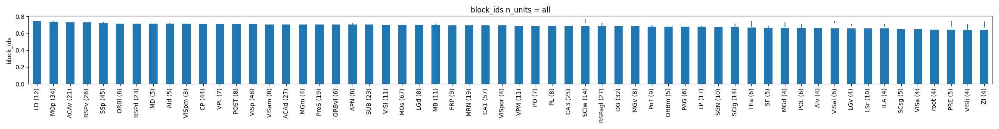

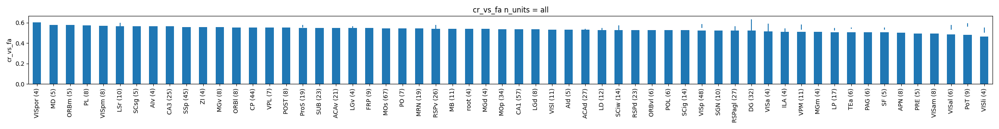

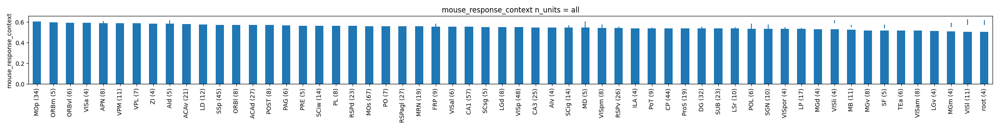

In [13]:
for pr in predict:

    # unique_areas=area_block_decoding[pr]['area'].unique()
    
    min_n_recs=4

    # n_exps=len(area_block_decoding[pr]['area'].value_counts())
    incl_areas=area_block_decoding_means[pr]['area'][(area_block_decoding_means[pr]['n_recs']>=min_n_recs)]
    area_means=area_block_decoding_means[pr]['balanced_accuracy'][(area_block_decoding_means[pr]['n_recs']>=min_n_recs)]
    area_stds=area_block_decoding_means[pr]['balanced_accuracy_sem'][(area_block_decoding_means[pr]['n_recs']>=min_n_recs)]
    area_n_recs=area_block_decoding_means[pr]['n_recs'][(area_block_decoding_means[pr]['n_recs']>=min_n_recs)]

    area_labels=[]
    for ia,aa in enumerate(incl_areas):
        area_labels.append(aa+' ('+str(area_n_recs.iloc[ia])+')')

    fig,ax=plt.subplots(figsize=(len(area_means)*0.4,3))
    ax=area_means.plot.bar()
    ax.set_xticklabels(area_labels)

    ax.errorbar(area_means.index,area_means.values,area_stds.values,linestyle='')

    # ax.set_ylim([0.5,0.95])
    ax.set_ylabel(pr)
    ax.set_title(pr+' n_units = '+str(n_units_incl))

    fig.tight_layout()

In [118]:
# svc_results[sel_session][p][aa][tt][uu][nn]['balanced_accuracy']
# uu
len(svc_results[sel_session][p][aa][tt][uu])

1

In [77]:
svc_results[1]['block_ids'].keys()

dict_keys(['all', 'MOs_probeA', 'AIv', 'PL', 'ProS', 'SSp', 'AId', 'ORBl', 'ORBm', 'VISal', 'VISp', 'CP', 'APN', 'MOs_probeB', 'FRP', 'AON', 'CA3', 'CA1', 'ACAd', 'DG_probeE'])

In [81]:
svc_results[1]['block_ids']['ORBm'][0][1][0]['balanced_accuracy']

0.7110982537344834

In [84]:
svc_results[1]['cr_vs_fa']['ORBm'][0][1][0]['balanced_accuracy']

0.6058640373637779

In [83]:
svc_results[1]['mouse_response_context']['ORBl'][0][1][0]['balanced_accuracy']

0.6036106750392465

In [100]:
svc_results[0].keys()

dict_keys(['predict', 'trial_numbers', 'unit_numbers', 'min_n_units', 'n_repeats', 'time_bins', 'spikes_time_before', 'spikes_time_after', 'spikes_binsize', 'decoder_time_before', 'decoder_time_after', 'decoder_binsize', 'balance_labels', 'crossval', 'all_areas', 'labels_as_index', 'decoder_type', 'generate_labels', 'session_id', 'block_ids', 'crossval_index', 'cr_vs_fa', 'mouse_response_context'])

In [106]:
svc_results[0]['cr_vs_fa']['all'][0][0][0].keys()

dict_keys(['cr', 'pred_label', 'true_label', 'pred_label_all', 'trials_used', 'decision_function', 'decision_function_all', 'coefs', 'classes', 'intercept', 'params', 'balanced_accuracy', 'pred_label_train', 'true_label_train', 'cr_train', 'balanced_accuracy_train', 'train_trials', 'test_trials', 'models', 'scaler', 'label_names', 'labels', 'shuffle', 'trial_sel_idx', 'unit_sel_idx'])

In [94]:
svc_results[0]['cr_vs_fa']['all'][0][1][0]['trial_sel_idx'].values

array([  5,  17,  18,  19,  20,  29,  37,  39,  43,  44,  53,  59,  67,
        69,  73,  81,  90,  92,  97,  98, 103, 109, 115, 118, 125, 130,
       133, 136, 137, 143, 150, 156, 160, 176, 179, 180, 184, 190, 198,
       204, 209, 210, 213, 224, 225, 232, 234, 236, 240, 245, 251, 252,
       261, 262, 273, 275, 278, 286, 291, 298, 300, 304, 313, 317, 320,
       323, 326, 328, 332, 340, 343, 357, 358, 359, 360, 371, 376, 377,
       380, 385, 388, 397, 398, 400, 402, 412, 419, 421, 423, 425, 444,
       448, 456, 459, 465, 473, 477, 480, 487, 489, 498, 499, 502, 505,
       511, 513], dtype=int64)

In [96]:
svc_results[0]['mouse_response_context']['all'][0][1][0]['trial_sel_idx'].values

array([  5,  17,  18,  19,  20,  29,  37,  39,  43,  44,  53,  59,  67,
        69,  73,  81,  90,  92,  97,  98, 103, 109, 115, 118, 125, 130,
       133, 136, 137, 143, 150, 156, 160, 176, 179, 180, 184, 190, 198,
       204, 209, 210, 213, 224, 225, 232, 234, 236, 240, 245, 251, 252,
       261, 262, 273, 275, 278, 286, 291, 298, 300, 304, 313, 317, 320,
       323, 326, 328, 332, 340, 343, 357, 358, 359, 360, 371, 376, 377,
       380, 385, 388, 397, 398, 400, 402, 412, 419, 421, 423, 425, 444,
       448, 456, 459, 465, 473, 477, 480, 487, 489, 498, 499, 502, 505,
       511, 513], dtype=int64)

In [45]:
trials.columns

Index(['start_time', 'stop_time', 'quiescent_start_time',
       'quiescent_stop_time', 'stim_start_time', 'stim_stop_time',
       'response_window_start_time', 'response_window_stop_time',
       'task_control_response_time', 'response_time', 'reward_time',
       'post_response_window_start_time', 'post_response_window_stop_time',
       'stim_name', 'block_index', 'context_name', 'trial_index',
       'trial_index_in_block', 'repeat_index', 'is_response', 'is_correct',
       'is_incorrect', 'is_hit', 'is_false_alarm', 'is_correct_reject',
       'is_miss', 'is_go', 'is_nogo', 'is_rewarded', 'is_noncontingent_reward',
       'is_contingent_reward', 'is_reward_scheduled', 'is_aud_stim',
       'is_vis_stim', 'is_catch', 'is_target', 'is_aud_target',
       'is_vis_target', 'is_nontarget', 'is_aud_nontarget', 'is_vis_nontarget',
       'is_vis_context', 'is_aud_context', 'is_context_switch', 'is_repeat',
       'is_opto', 'session_idx', 'date', 'subject_id', 'session_id'],
      dtyp

In [32]:
CR_FA_trials=trials.query('(is_correct_reject and is_target) or (is_false_alarm and is_target)')

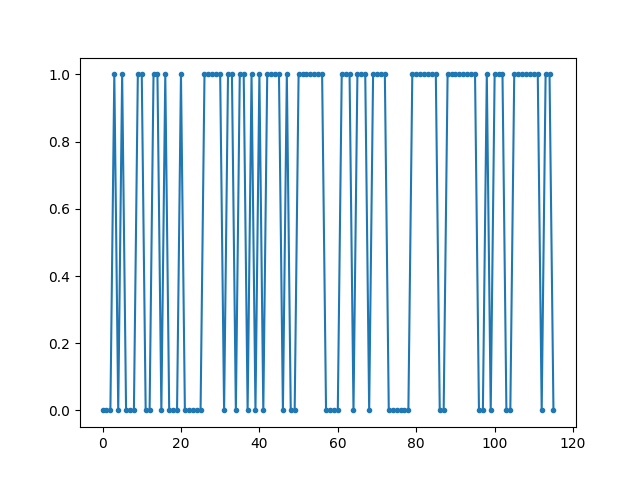

In [33]:
fig,ax=plt.subplots(1,1)
ax.plot(CR_FA_trials['is_correct_reject'].values,'.-',label='CR')

In [34]:
CR_FA_trials['stim_name'].values

array(['vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1',
       'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1',
       'vis1', 'vis1', 'vis1', 'sound1', 'sound1', 'sound1', 'sound1',
       'sound1', 'sound1', 'sound1', 'sound1', 'sound1', 'sound1',
       'sound1', 'sound1', 'sound1', 'sound1', 'sound1', 'sound1',
       'sound1', 'sound1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1',
       'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1',
       'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'sound1', 'sound1',
       'sound1', 'sound1', 'sound1', 'sound1', 'sound1', 'sound1',
       'sound1', 'sound1', 'sound1', 'sound1', 'sound1', 'sound1',
       'sound1', 'sound1', 'sound1', 'sound1', 'sound1', 'vis1', 'vis1',
       'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1',
       'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1', 'vis1',
       'vis1', 'vis1', 'sound1', 'sound1', 'sound1', 'sound1', 'sound1',
       'so

In [35]:
#add new labels to trials = visual_context_like_behavior, auditory_context_like_behavior

behavior_type=[]

for ii in range(len(CR_FA_trials)):
    if ((CR_FA_trials.iloc[ii]['is_vis_context'] and CR_FA_trials.iloc[ii]['is_aud_target'] and not CR_FA_trials.iloc[ii]['is_response']) or
        (CR_FA_trials.iloc[ii]['is_aud_context'] and CR_FA_trials.iloc[ii]['is_vis_target'] and CR_FA_trials.iloc[ii]['is_response'])):
        behavior_type.append('vis_context_like')
    elif ((CR_FA_trials.iloc[ii]['is_aud_context'] and CR_FA_trials.iloc[ii]['is_vis_target'] and not CR_FA_trials.iloc[ii]['is_response']) or
          (CR_FA_trials.iloc[ii]['is_vis_context'] and CR_FA_trials.iloc[ii]['is_aud_target'] and CR_FA_trials.iloc[ii]['is_response'])):
        behavior_type.append('aud_context_like')

CR_FA_trials['behavior_type']=behavior_type

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_31684\4129589101.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  CR_FA_trials['behavior_type']=behavior_type


In [36]:
CR_FA_trials['behavior_type'].values

array(['vis_context_like', 'vis_context_like', 'vis_context_like',
       'aud_context_like', 'vis_context_like', 'aud_context_like',
       'vis_context_like', 'vis_context_like', 'vis_context_like',
       'aud_context_like', 'aud_context_like', 'vis_context_like',
       'vis_context_like', 'aud_context_like', 'aud_context_like',
       'vis_context_like', 'aud_context_like', 'vis_context_like',
       'vis_context_like', 'aud_context_like', 'vis_context_like',
       'aud_context_like', 'aud_context_like', 'aud_context_like',
       'aud_context_like', 'aud_context_like', 'vis_context_like',
       'vis_context_like', 'vis_context_like', 'vis_context_like',
       'vis_context_like', 'aud_context_like', 'vis_context_like',
       'vis_context_like', 'aud_context_like', 'vis_context_like',
       'vis_context_like', 'vis_context_like', 'aud_context_like',
       'vis_context_like', 'aud_context_like', 'vis_context_like',
       'aud_context_like', 'aud_context_like', 'aud_context_li

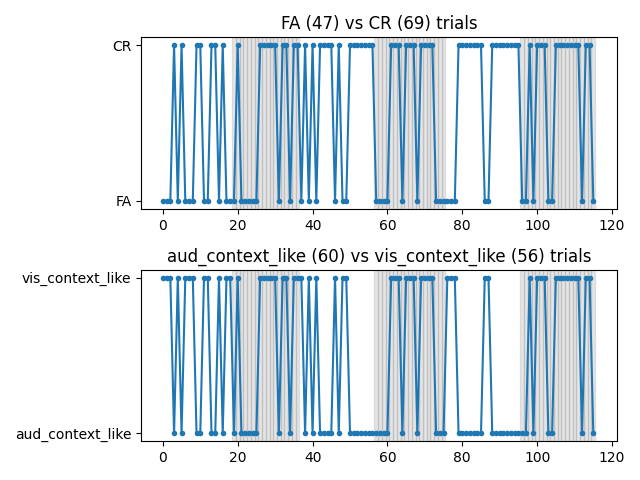

In [43]:
n_CR_trials=len(CR_FA_trials.query('is_correct_reject'))
n_FA_trials=len(CR_FA_trials.query('is_false_alarm'))
n_vis_context_like_trials=len(CR_FA_trials.query('behavior_type=="vis_context_like"'))
n_aud_context_like_trials=len(CR_FA_trials.query('behavior_type=="aud_context_like"'))

fig,ax=plt.subplots(2,1)
#shade the is_vis_context trials
for ii in range(len(CR_FA_trials)):
    if CR_FA_trials.iloc[ii]['is_vis_context']:
        ax[0].axvspan(ii-0.5,ii+0.5, color='gray', alpha=0.2)
        ax[1].axvspan(ii-0.5,ii+0.5, color='gray', alpha=0.2)

ax[0].plot(CR_FA_trials['is_correct_reject'].values,'.-',label='CR')
ax[0].set_yticks([0,1])
ax[0].set_yticklabels(['FA','CR'])
ax[0].set_title('FA ('+str(n_FA_trials)+') vs CR ('+str(n_CR_trials)+') trials')

ax[1].plot(CR_FA_trials['behavior_type'].values=='vis_context_like','.-',label='behavior_type')
ax[1].set_yticks([0,1])
ax[1].set_yticklabels(['aud_context_like','vis_context_like'])
ax[1].set_title('aud_context_like ('+str(n_aud_context_like_trials)+') vs vis_context_like ('+str(n_vis_context_like_trials)+') trials')
fig.tight_layout()

In [ ]:
# 

In [41]:
# np.sum(CR_FA_trials['behavior_type'].values=='vis_context_like')

56

In [ ]:
# 